# Part 1

First 5 rows of the dataset:
   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            6      148             72             35        0  33.6   
1            1       85             66             29        0  26.6   
2            8      183             64              0        0  23.3   
3            1       89             66             23       94  28.1   
4            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  

Data Types and Missing Values:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies            

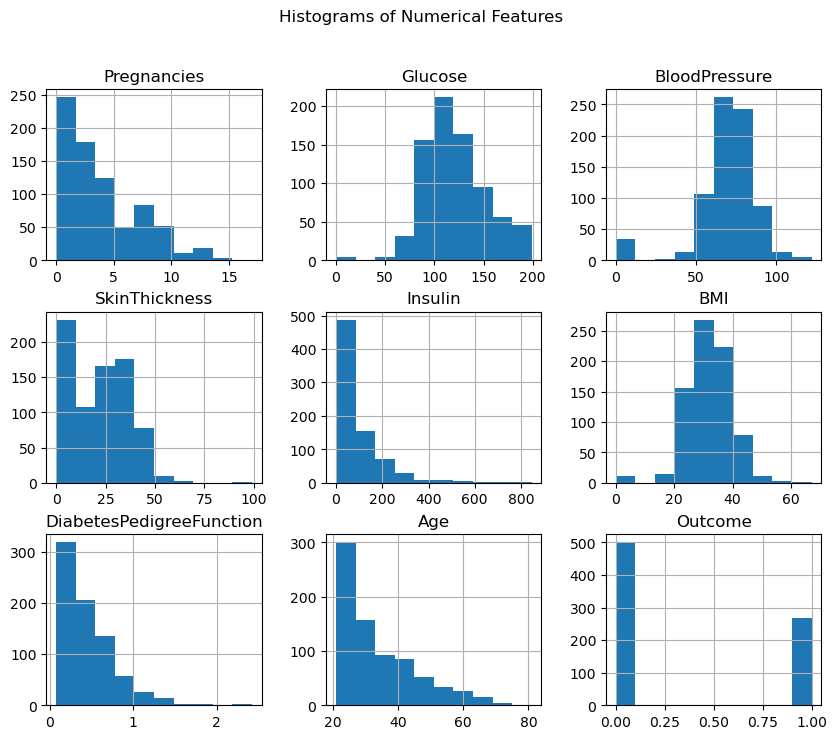

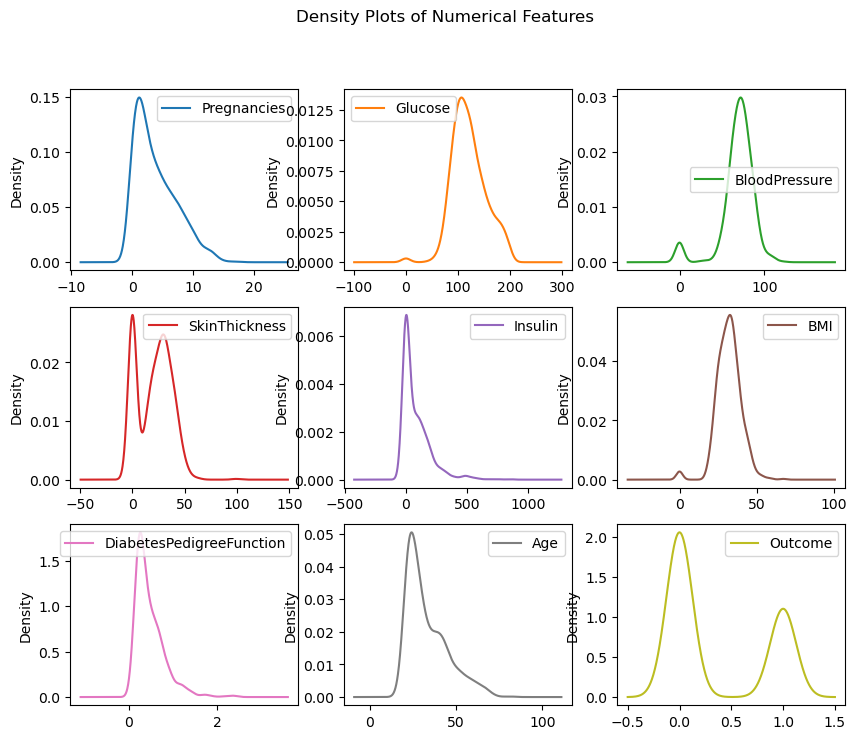

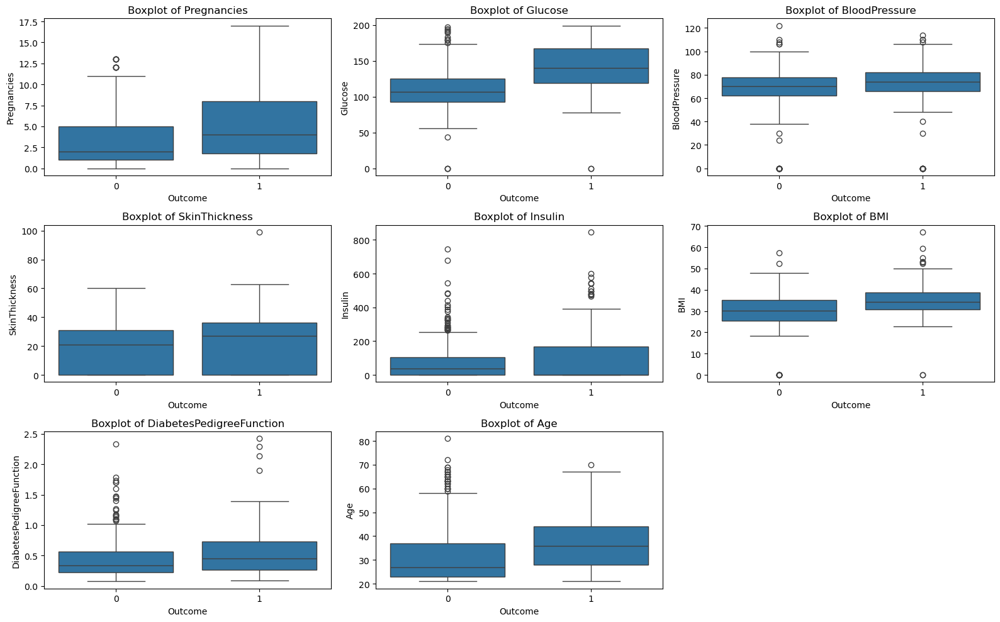

The figure layout has changed to tight


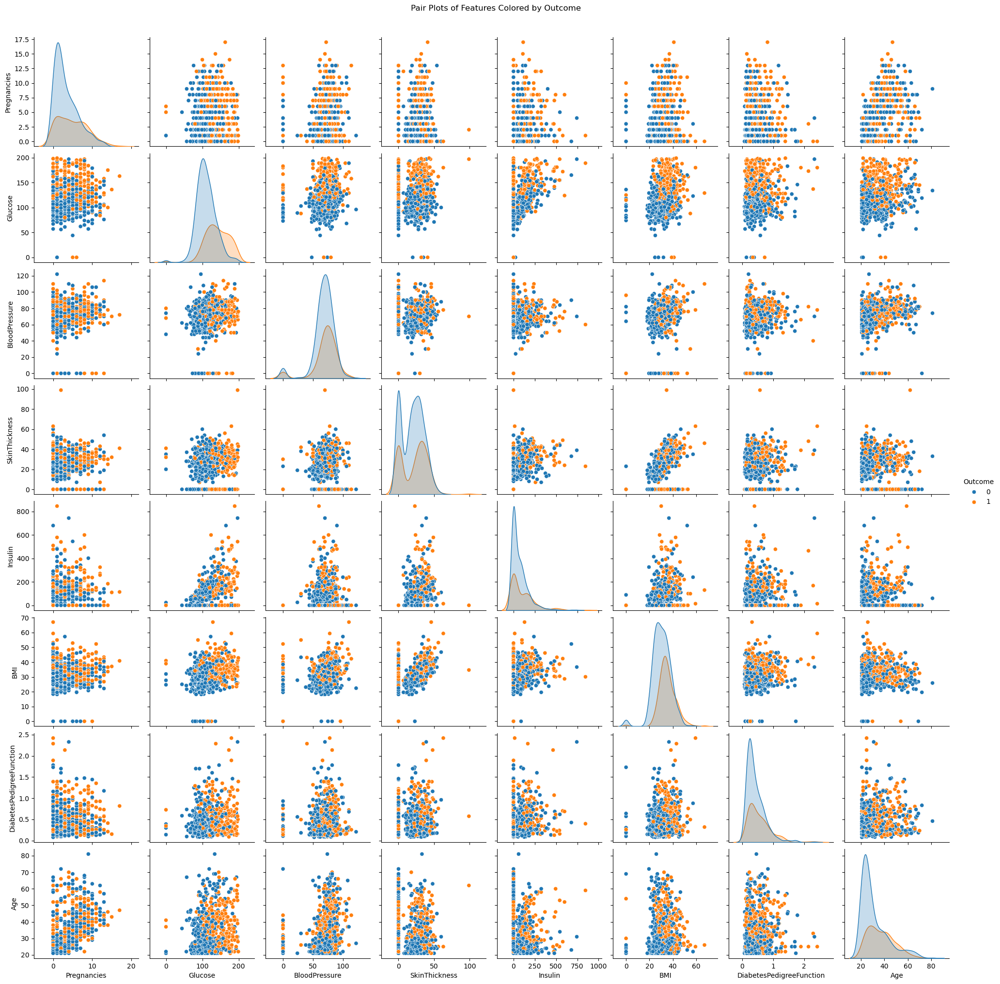

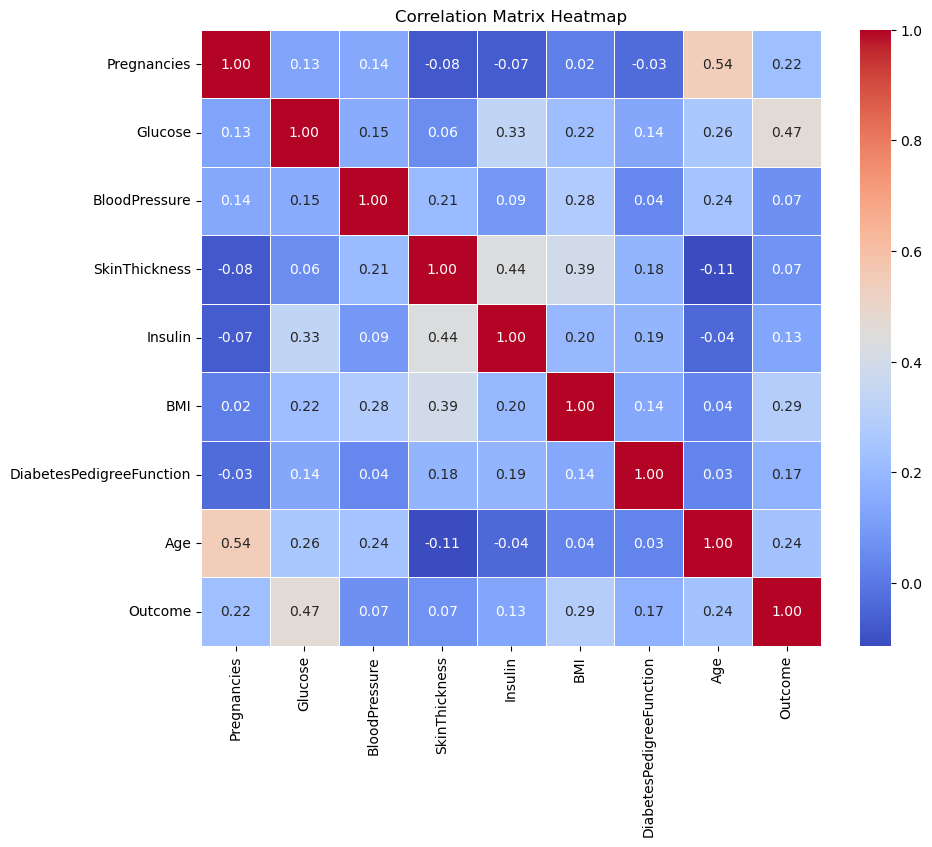

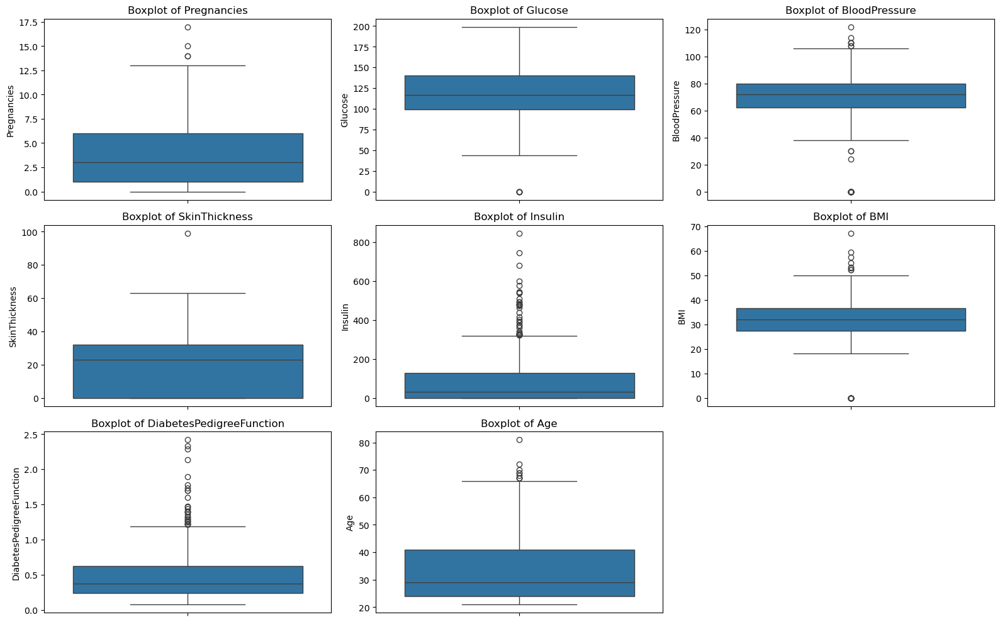

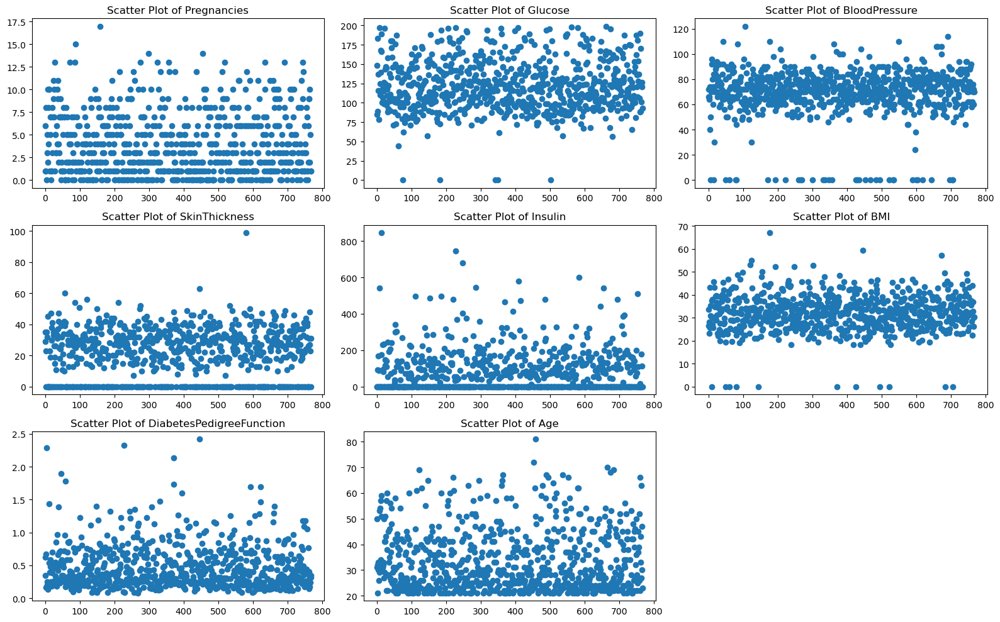

In [156]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

# Suppress specific FutureWarning
# warnings.filterwarnings("ignore", category=FutureWarning, message=".*is_categorical_dtype.*")

# Load the dataset
file_path = './diabetes.csv'
df = pd.read_csv(file_path)

# Data Overview
print("First 5 rows of the dataset:")
print(df.head())

print("\nData Types and Missing Values:")
print(df.info())

print("\nSummary Statistics:")
print(df.describe())

# Handling Missing Values (if any)
print("\nMissing Values:")
print(df.isnull().sum())

# # Descriptive Statistics
# print("\nDescriptive Statistics for Numerical Columns:")
# print(df.describe())

# Frequency counts for categorical columns (if any)
# Example for categorical column:
# print(df['categorical_column'].value_counts())

# Visualizations

# Histograms and Density Plots
df.hist(figsize=(10, 8))
plt.suptitle('Histograms of Numerical Features')
plt.show()

df.plot(kind='density', subplots=True, layout=(3, 3), sharex=False, figsize=(10, 8))
plt.suptitle('Density Plots of Numerical Features')
plt.show()

# Box Plots for Identifying Outliers
plt.figure(figsize=(16, 10))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='Outcome', y=column, data=df)
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

# Scatter Plots and Pair Plots for Relationships
sns.pairplot(df, hue='Outcome')
plt.suptitle('Pair Plots of Features Colored by Outcome', y=1.02)
plt.show()

# Correlation Matrix and Heatmap
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

# Categorical Data Analysis
# Example for bar plot:
# sns.countplot(x='categorical_column', data=df)
# plt.title('Count Plot of Categorical Column')
# plt.show()

# Outlier Detection using Box Plots
plt.figure(figsize=(16, 10))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(data=df[column])
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

# Scatter plots for identifying outliers
plt.figure(figsize=(16, 10))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(3, 3, i)
    plt.scatter(df.index, df[column])
    plt.title(f'Scatter Plot of {column}')
plt.tight_layout()
plt.show()

## A

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

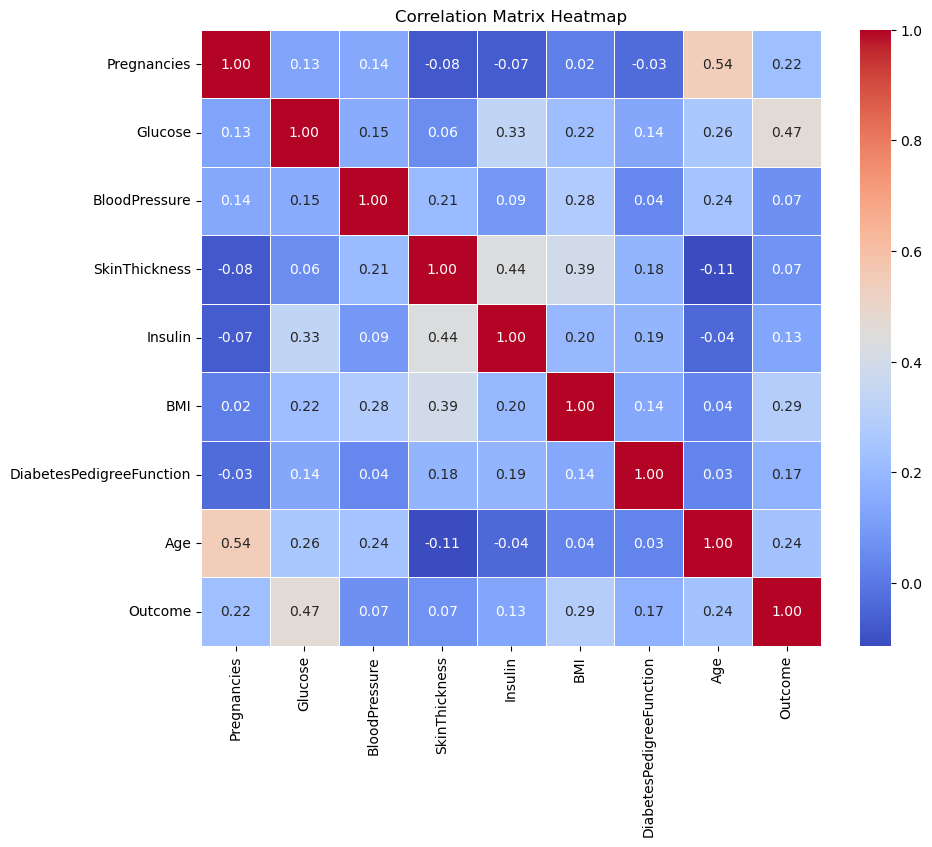

/home/sajad/anaconda3/envs/py311/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


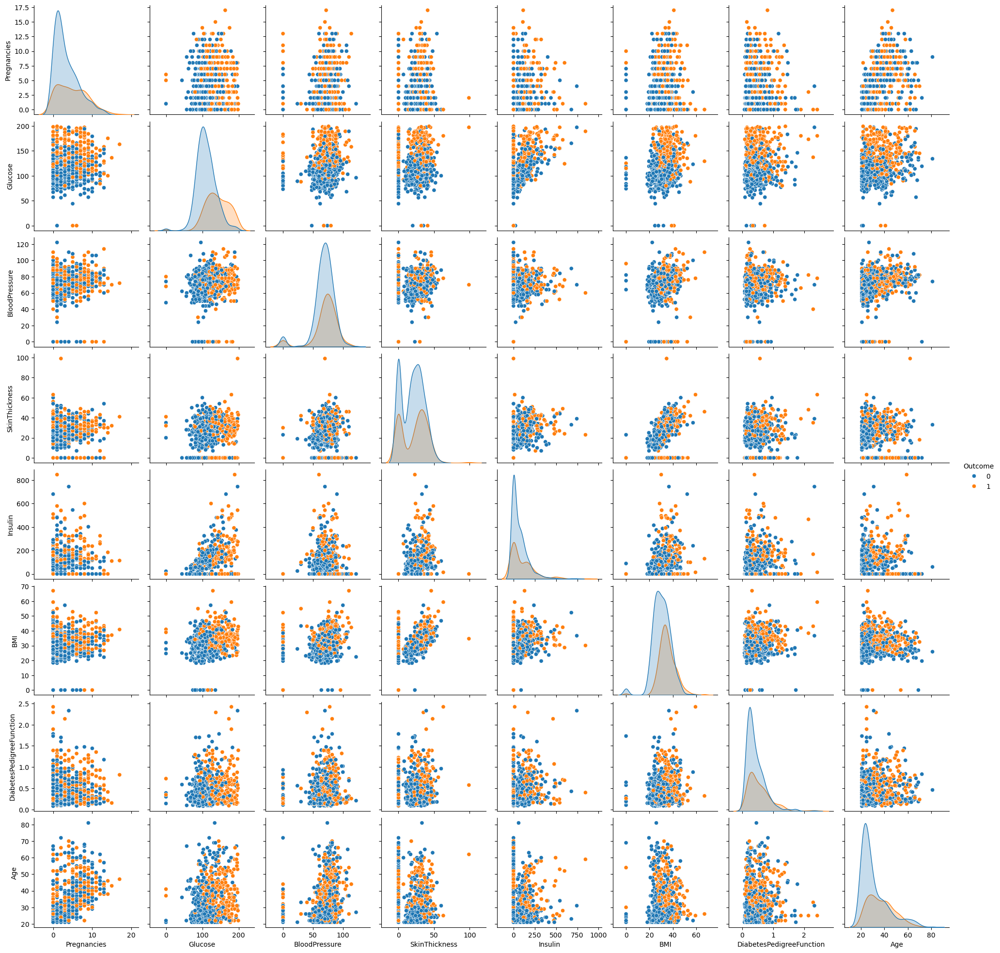

In [21]:
df = pd.read_csv('./diabetes.csv')


correlation_matrix = df.corr()
# styled_corr_matrix = correlation_matrix.style.background_gradient(cmap='coolwarm')

# # Save the styled correlation matrix to an HTML file
# styled_corr_matrix.to_html('correlation_matrix.html')

# Display the correlation matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

sns.pairplot(df, hue='Outcome')
plt.show()

## B

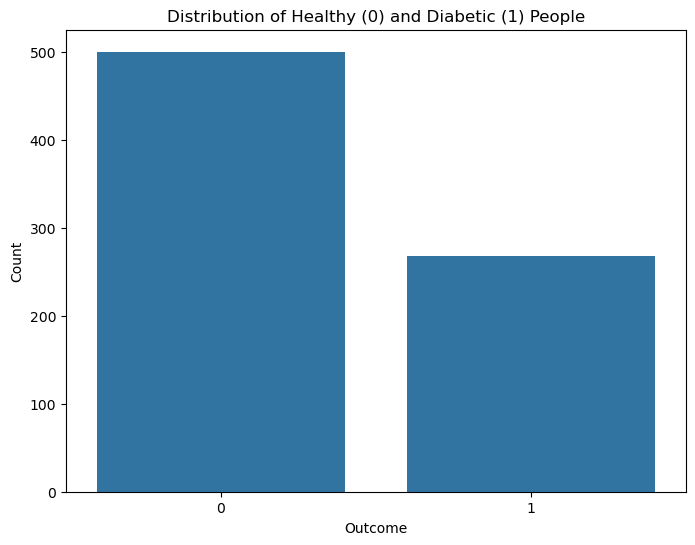

In [9]:
# Plotting the distribution of healthy and diabetic people
plt.figure(figsize=(8, 6))
sns.countplot(x='Outcome', data=df)
plt.title('Distribution of Healthy (0) and Diabetic (1) People')
plt.xlabel('Outcome')
plt.ylabel('Count')
plt.show()

## C

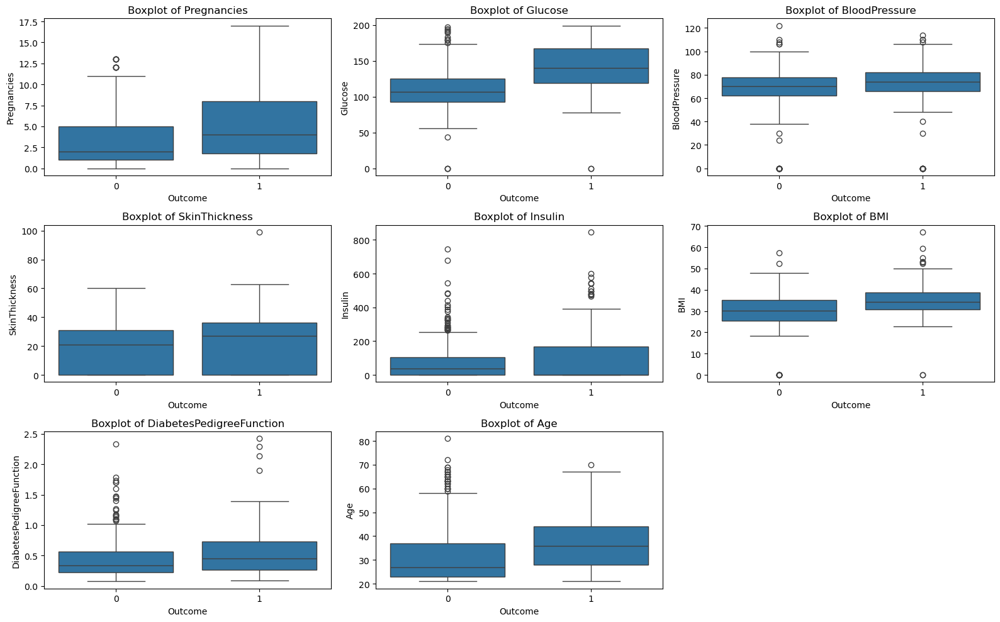

In [10]:
# Checking for outliers using boxplots
plt.figure(figsize=(16, 10))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='Outcome', y=column, data=df)
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

In [8]:
import os
import pickle
# Save given variables to file_path
def save_vars(file_path, **kwargs):
  if os.path.exists(file_path):
    with open(file_path, 'wb+') as f:
        pickle.dump(kwargs, f)
  else:
    with open(file_path, 'xb+') as f:
        pickle.dump(kwargs, f)

# Load variables from file_path
def load_vars(file_path):
    with open(file_path, 'rb') as f:
        vars_dict = pickle.load(f)
    return vars_dict

In [9]:
# Plotting losses and accuracy for each epoch
import matplotlib.pyplot as plt
def plot_results(log_lst, logs_name ,title, xlabel, ylabel):

    if len(logs_name) != len(log_lst):
        raise ValueError('logs_name and log_lst should have same length')
    
    x = np.arange(1, len(log_lst[0])+1) # x values starting from 1
    
    for logs, logs_name in zip(log_lst, logs_name):
        # plt.plot(x,logs, label=logs_name, marker='o', markersize=3)
        plt.plot(x,logs, label=logs_name)
    
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [10]:
X_train.to_numpy().shape

(537, 8)

In [11]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = './diabetes.csv'
df = pd.read_csv(file_path)

columns_shouldnt_have_zero = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']
for column in columns_shouldnt_have_zero:
    median_value = df[df[column] != 0][column].median()
    df[column] = df[column].replace(0, median_value)

# Split the dataset into features and target
X = df.drop(columns='Outcome')
y = df['Outcome']

random_state = 40
# Split the data into training (70%), validation (10%), and testing (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=random_state)

# Further split the temporary set into validation (10% of original) and testing (20% of original) sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=random_state)

# Normalize the data
scaler = StandardScaler()
X_train_normal = scaler.fit_transform(X_train.to_numpy())
X_val_normal = scaler.transform(X_val.to_numpy())
X_test_normal = scaler.transform(X_test.to_numpy())

# Checking the shapes of the train, validation, and test sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

uni, counts = np.unique(y_train, return_counts=True)
weights_dict = {i : j / counts.sum() for i, j in zip(uni, counts)}

Training set shape: (537, 8) (537,)
Validation set shape: (77, 8) (77,)
Testing set shape: (154, 8) (154,)


In [12]:
import torch
import torch.nn as nn
import time
from torch.utils.data import DataLoader, TensorDataset

class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(8, 100),
            nn.ReLU(),
            nn.BatchNorm1d(100),
            nn.Linear(100, 50),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(50, 50),
            nn.ReLU(),
            nn.Linear(50, 20),
            nn.ReLU(),
            nn.Linear(20, 1),                    
        )

    def forward(self, x):
        return self.net(x)

In [13]:
def train(model, inputs, labels, optimizer, criterion, device):
    # class_weights = torch.empty((len(data[1]), 1), dtype=torch.float32)
    # for i, j in enumerate(labels):
    #     class_weights[i][0] = weights_dict[int(j.item())]
    # criterion = nn.CrossEntropyLoss(weight=weights)
    model.train()
    # start = time.time()
    optimizer.zero_grad()
    outputs = torch.sigmoid(model(inputs))
    # print('get model outs:', time.time() - start)
    # print(f"outputs: {outputs.dtype} , labels: {labels.dtype}", outputs.shape, labels.shape)
    loss = criterion(outputs, labels)
    # print('loss cal:', time.time() - start)
    loss.backward()
    # print('loss backward:', time.time() - start)
    optimizer.step()
    # print('opt step:', time.time() - start)
    # print('total step:', time.time() - start)
    # start = time.time()
    acc = (torch.round(outputs) == labels).float().sum() / labels.numel()
    return loss.item(), acc

In [14]:
def validate(model, inputs, labels, criterion, device):
    model.eval()
    with torch.inference_mode():
        outputs = torch.sigmoid(model(inputs))
    loss = criterion(outputs, labels)
    acc = (torch.round(outputs) == labels).float().sum() / labels.numel()
    return loss.item(), acc

In [15]:
lr = 1e-2
# batch_size = 128
device = 'cuda'

X_train_tensor = torch.tensor(X_train_normal, dtype=torch.float, device=device)
X_val_tensor = torch.tensor(X_val_normal, dtype=torch.float, device=device)
X_test_tensor = torch.tensor(X_test_normal, dtype=torch.float, device=device)

y_train_tensor = torch.tensor(y_train.to_numpy(), dtype=torch.float, device=device).unsqueeze(-1)
y_val_tensor = torch.tensor(y_val.to_numpy(), dtype=torch.float, device=device).unsqueeze(-1)
y_test_tensor = torch.tensor(y_test.to_numpy(), dtype=torch.float, device=device).unsqueeze(-1)

# train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
# val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
# val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
# test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
# Initialize the model and the optimizer
torch.manual_seed(42)
model = Net().to(device)
optimizer = torch.optim.Adam(model.parameters(),
                              lr=lr)
# class_weights = torch.empty((len(y_train_tensor), 1), dtype=torch.float32)
# for i, j in enumerate(y_train_tensor):
#     class_weights[i][0] = weights_dict[int(j.item())]
# t_criterion = nn.BCELoss(weight=class_weights.to(device))
criterion = nn.BCELoss()

train_loss = np.zeros((0))
val_loss = np.zeros((0))
train_acc = np.zeros((0))
val_acc = np.zeros((0))
epoch_counter = 0
epoch_total = 0
min_val_loss = 99999999 #initialized as inf

In [239]:
num_epochs = 100
torch.manual_seed(42)
epoch_total = epoch_counter + num_epochs
train_loss = np.concatenate((train_loss, np.zeros((num_epochs))), )
val_loss = np.concatenate((val_loss, np.zeros((num_epochs))), )
train_acc = np.concatenate((train_acc, np.zeros((num_epochs))), )
val_acc = np.concatenate((val_acc, np.zeros((num_epochs))), )

for epoch in range(num_epochs):
    start_time = time.time()
    # train for one epoch
    tmp_metrics = train(model, X_train_tensor, y_train_tensor, optimizer, criterion, device)
    train_loss[epoch_counter], train_acc[epoch_counter] = tmp_metrics
    # calculate validation loss for this epoch
    tmp_metrics = validate(model, X_val_tensor, y_val_tensor, criterion, device)
    val_loss[epoch_counter], val_acc[epoch_counter] = tmp_metrics
    # print the results for this epoch
    if (epoch_counter+1) % 10 == 0:
        print('\nEpoch [{}/{}], Training loss: {:.4f}, Valid loss: {:.4f}, Training acc: {:.4f}, Valid acc: {:.4f}, LR: {:.8f}, time: {:.2f} s'
           .format(epoch_counter+1, epoch_total, train_loss[epoch_counter],
                   val_loss[epoch_counter], train_acc[epoch_counter], val_acc[epoch_counter], lr,
                   time.time() - start_time
                  ))
    
    if min_val_loss > val_loss[epoch_counter]:
        torch.save(model.state_dict(), './models/mlp_min_loss_cp0.pt')
        print('state dict saved.', end=' ')
        min_val_loss = val_loss[epoch_counter]
    epoch_counter += 1
    tmp = {'train_loss' : train_loss[:epoch_counter],
        'val_loss' : val_loss[:epoch_counter],
        'min_val_loss' : min_val_loss,
        'lr' : lr,
        'epoch_counter' : epoch_counter,
        'state_dict' : model.cpu().state_dict(),}
    # print('variables saved.')
    model = model.to(device)
    save_vars('./tmp/mlp_cp0.pkl', **tmp)

state dict saved. state dict saved. state dict saved. state dict saved. state dict saved. state dict saved. 
Epoch [10/100], Training loss: 0.4328, Valid loss: 0.5264, Training acc: 0.8082, Valid acc: 0.7013, LR: 0.01000000, time: 0.00 s

Epoch [20/100], Training loss: 0.3650, Valid loss: 0.5286, Training acc: 0.8343, Valid acc: 0.7013, LR: 0.01000000, time: 0.00 s

Epoch [30/100], Training loss: 0.2724, Valid loss: 0.6932, Training acc: 0.8827, Valid acc: 0.6883, LR: 0.01000000, time: 0.00 s

Epoch [40/100], Training loss: 0.2137, Valid loss: 1.1833, Training acc: 0.8976, Valid acc: 0.6623, LR: 0.01000000, time: 0.00 s

Epoch [50/100], Training loss: 0.1332, Valid loss: 1.8420, Training acc: 0.9460, Valid acc: 0.6104, LR: 0.01000000, time: 0.00 s

Epoch [60/100], Training loss: 0.1147, Valid loss: 3.7568, Training acc: 0.9404, Valid acc: 0.6494, LR: 0.01000000, time: 0.00 s

Epoch [70/100], Training loss: 0.0809, Valid loss: 5.2414, Training acc: 0.9739, Valid acc: 0.6364, LR: 0.01000

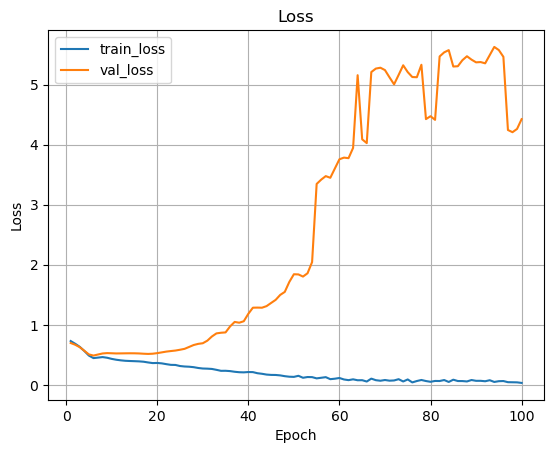

In [240]:
plot_results([train_loss[:], val_loss[:]], ['train_loss', 'val_loss'], 'Loss', 'Epoch', 'Loss')

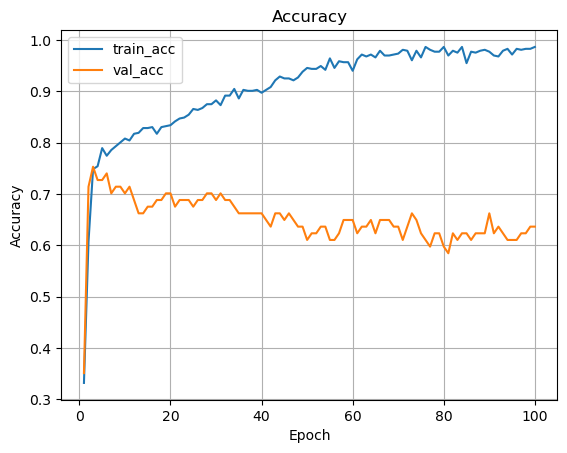

In [241]:
plot_results([train_acc[:], val_acc[:]], ['train_acc', 'val_acc'], 'Accuracy', 'Epoch', 'Accuracy')

In [16]:
checkpoint = torch.load('./models/mlp_min_loss_cp0.pt')
model.load_state_dict(checkpoint) 

<All keys matched successfully>

              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84        92
         1.0       0.80      0.66      0.73        62

    accuracy                           0.80       154
   macro avg       0.80      0.78      0.78       154
weighted avg       0.80      0.80      0.79       154



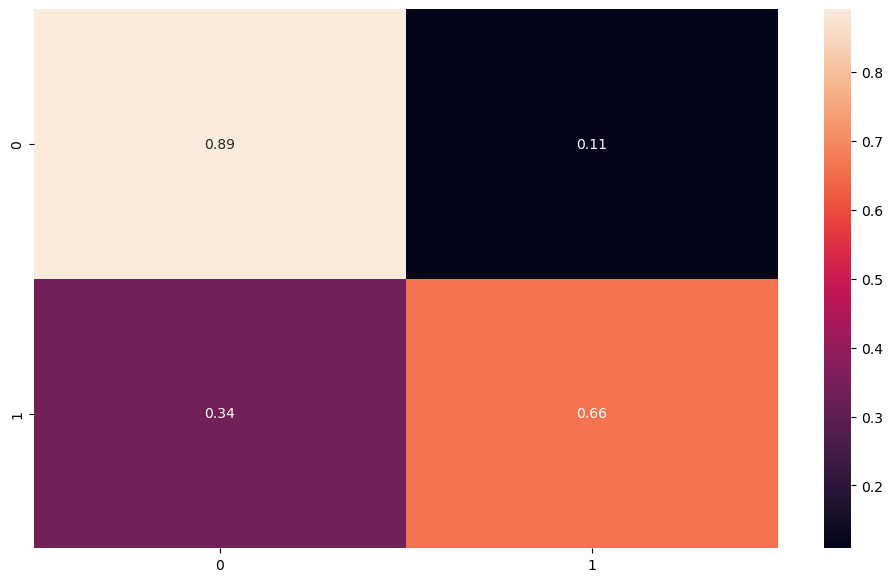

In [243]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
with torch.inference_mode():
    test_outputs = torch.sigmoid(model(X_test_tensor))
    # t_loss = criterion(test_outputs, y_test_tensor[:,0])
    # acc = (torch.round(test_outputs) == labels).float().sum() / labels.numel()
predictions = torch.round(test_outputs).cpu().numpy()
actual_labels =  y_test_tensor[:,0].cpu().numpy()
print(classification_report(actual_labels, predictions))
conf_mat = confusion_matrix(actual_labels, predictions)
df_cm = pd.DataFrame(conf_mat / np.sum(conf_mat, axis=1)[:, None],
                     index = [0,1], columns = [0,1])
plt.figure(figsize = (12,7))
sns.heatmap(df_cm, annot=True)
# df_cm.show()
plt.show()

# Part2

In [17]:
import lime.lime_tabular
import random

In [18]:
import torch
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
device = 'cuda'

# Load the dataset
file_path = './diabetes.csv'
df = pd.read_csv(file_path)

columns_shouldnt_have_zero = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']
for column in columns_shouldnt_have_zero:
    median_value = df[df[column] != 0][column].median()
    df[column] = df[column].replace(0, median_value)

# Split the dataset into features and target
X = df.drop(columns='Outcome')
y = df['Outcome']

random_state = 40
# Split the data into training (70%), validation (10%), and testing (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=random_state)

# Further split the temporary set into validation (10% of original) and testing (20% of original) sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=random_state)

# Normalize the data
scaler = StandardScaler()
X_train_normal = scaler.fit_transform(X_train.to_numpy())
X_val_normal = scaler.transform(X_val.to_numpy())
X_test_normal = scaler.transform(X_test.to_numpy())

# Checking the shapes of the train, validation, and test sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

uni, counts = np.unique(y_train, return_counts=True)
weights_dict = {i : j / counts.sum() for i, j in zip(uni, counts)}

Training set shape: (537, 8) (537,)
Validation set shape: (77, 8) (77,)
Testing set shape: (154, 8) (154,)


In [19]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), feature_names=X_train.columns, class_names=['normal', 'diabetic'], discretize_continuous=True)

In [20]:
def model_predict(input_data):
    # input_data = input_data
    # print(input_data.shape)
    input_tensor = torch.tensor(scaler.transform(input_data), dtype=torch.float32).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.sigmoid(outputs).cpu().numpy()
    # print('in')
    probabilities = np.hstack([1 - probabilities, probabilities])
    # print('f')
    # print(probabilities.shape)
    return probabilities

In [21]:
random_indices = random.sample(range(X_test.shape[0]), 3)

In [22]:
print(random_indices)
for idx in random_indices:
    # print(X_test.iloc[idx])
    exp = explainer.explain_instance(data_row=X_test.to_numpy()[idx], predict_fn=model_predict)
    exp.show_in_notebook(show_table=True, show_all=False)

[58, 40, 73]


In [23]:
import shap
import torch
import random

# Convert X_test and y_test back to their original form if they were scaled
# X_test_original = scaler.inverse_transform(X_test)

# Function to predict using the trained PyTorch model
def model_predict(input_data):
    input_tensor = torch.tensor(scaler.transform(input_data), dtype=torch.float32).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.sigmoid(outputs).cpu().numpy()
        # probabilities = np.hstack([1 - probabilities, probabilities])
    # print('f')
    # print(probabilities.shape)
    return probabilities
# random_indices = [78, 93, 102] # same as lime
# Initialize the SHAP KernelExplainer
shap_explainer = shap.KernelExplainer(model_predict, X_train.to_numpy())
shap_value = shap_explainer.shap_values(X_test.to_numpy()[random_indices])

shap.initjs()

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
Using 537 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/3 [00:00<?, ?it/s]

In [24]:
waterfall_explainer = shap.Explanation(values=shap_value[0], base_values=shap_explainer.expected_value.repeat(3), data=X_test.to_numpy()[random_indices], feature_names=df.drop(columns='Outcome').columns)

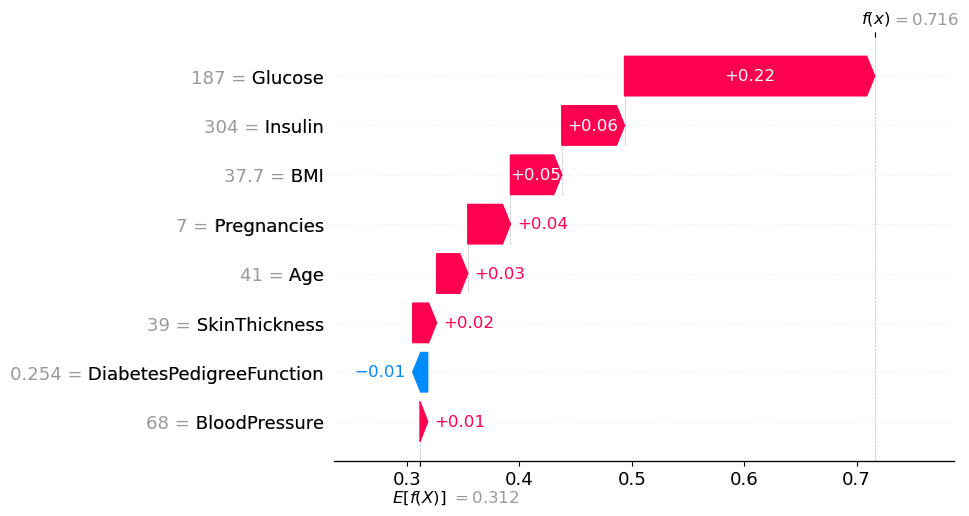

In [25]:
shap.waterfall_plot(waterfall_explainer[0])

In [26]:
idx = random_indices[0]
print(f"Actual Label: {y_test.to_numpy()[idx]}")

# Generate force_plot
shap.force_plot(shap_explainer.expected_value, shap_value[0][0], X_test.to_numpy()[idx], feature_names=df.drop(columns='Outcome').columns)

Actual Label: 1


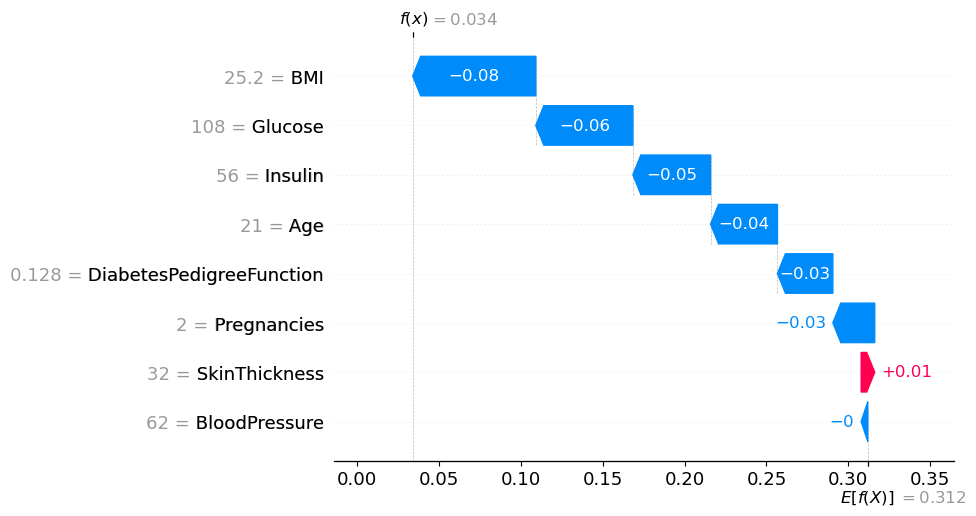

In [27]:
shap.waterfall_plot(waterfall_explainer[1])

In [28]:
idx = random_indices[1]
print(f"Actual Label: {y_test.to_numpy()[idx]}")

# Generate force_plot
shap.force_plot(shap_explainer.expected_value, shap_value[0][1], X_test.to_numpy()[idx], feature_names=df.drop(columns='Outcome').columns)

Actual Label: 0


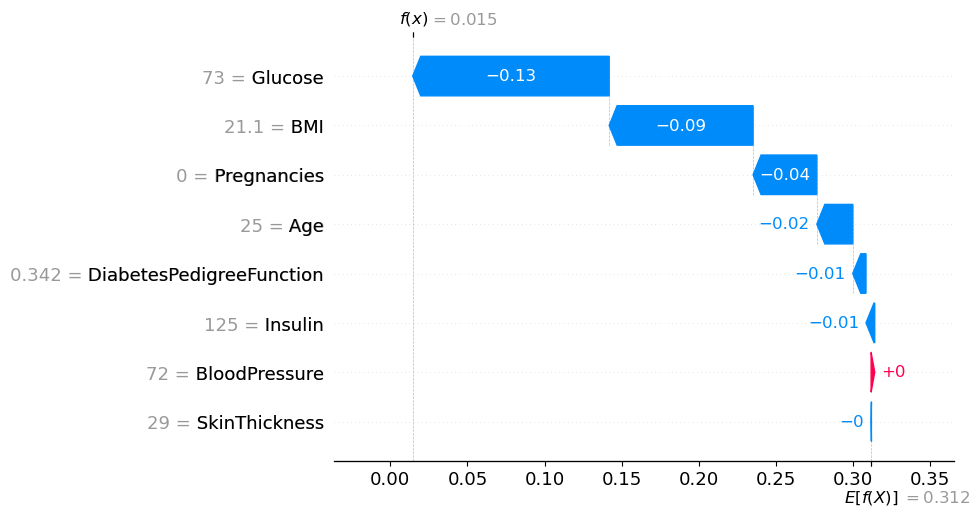

In [29]:
shap.waterfall_plot(waterfall_explainer[2])

In [30]:
idx = random_indices[2]
print(f"Actual Label: {y_test.to_numpy()[idx]}")

# Generate force_plot
shap.force_plot(shap_explainer.expected_value, shap_value[0][2], X_test.to_numpy()[idx], feature_names=df.drop(columns='Outcome').columns)

Actual Label: 0


## section 7


LIME Feature Importance:
BMI: 0.0883
Insulin: 0.0902
DiabetesPedigreeFunction: 0.0431
Glucose: 0.1492
Pregnancies: 0.0658
Age: 0.0473
BloodPressure: 0.0114
SkinThickness: 0.0388


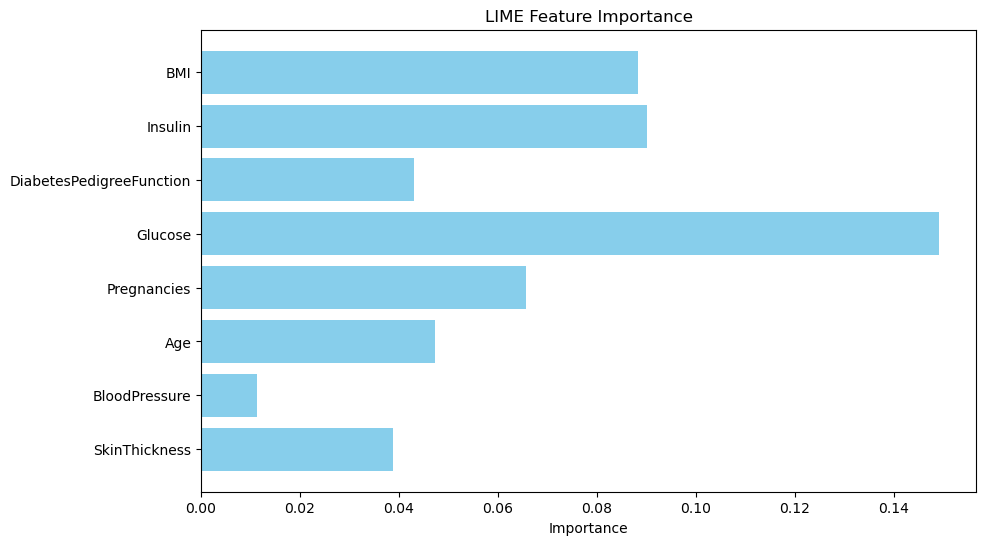

In [131]:
import matplotlib.pyplot as plt

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), feature_names=X_train.columns, class_names=['normal', 'diabetic'], discretize_continuous=True)
def model_predict_lime(input_data):
    # input_data = input_data
    # print(input_data.shape)
    input_tensor = torch.tensor(scaler.transform(input_data), dtype=torch.float32).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.sigmoid(outputs).cpu().numpy()
    # print('in')
    probabilities = np.hstack([1 - probabilities, probabilities])
    # print('f')
    # print(probabilities.shape)
    return probabilities


def plot_feature_importance(importance_dict, title):
    features = list(importance_dict.keys())
    importance = list(importance_dict.values())
    plt.figure(figsize=(10, 6))
    plt.barh(features, importance, color='skyblue')
    plt.xlabel('Importance')
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()
    
lime_importance = {'BMI':0, 'Insulin':0, 'DiabetesPedigreeFunction':0, 'Glucose':0, 'Pregnancies':0, 'Age':0, 'BloodPressure':0, 'SkinThickness':0}

for i in range(X_test.shape[0]):
    exp = explainer.explain_instance(data_row=X_test.to_numpy()[i], predict_fn=model_predict_lime)
    lime_values = exp.as_list()
    for feature, importance in lime_values:
        feature_key = [item for item in feature.split(' ') if item.isalpha()][0]
        lime_importance[feature_key] += abs(importance)

# Normalize LIME importance values
lime_importance = {feature: importance / X_test.shape[0] for feature, importance in lime_importance.items()}
print("\nLIME Feature Importance:")
for feature, importance in lime_importance.items():
    print(f"{feature}: {importance:.4f}")
plot_feature_importance(lime_importance, 'LIME Feature Importance')

for i in range(X_test.shape[0]):
    exp = explainer.explain_instance(data_row=X_test.to_numpy()[i], predict_fn=model_predict_lime)
    lime_values = exp.as_list()
    for feature, importance in lime_values:
        feature_key = [item for item in feature.split(' ') if item.isalpha()][0]
        lime_importance[feature_key] += importance

# # Normalize LIME importance values
# lime_importance = {feature: importance / X_test.shape[0] for feature, importance in lime_importance.items()}
# print("\nLIME Feature Importance:")
# for feature, importance in lime_importance.items():
#     print(f"{feature}: {importance:.4f}")
# plot_feature_importance(lime_importance, 'LIME Feature Importance')

In [ ]:
# Generate SHAP values for the test samples
shap_values = shap_explainer.shap_values(X_test)

SHAP Feature Importance:
Pregnancies: 0.0426
Glucose: 0.1073
BloodPressure: 0.0090
SkinThickness: 0.0222
Insulin: 0.0222
BMI: 0.0606
DiabetesPedigreeFunction: 0.0285
Age: 0.0323


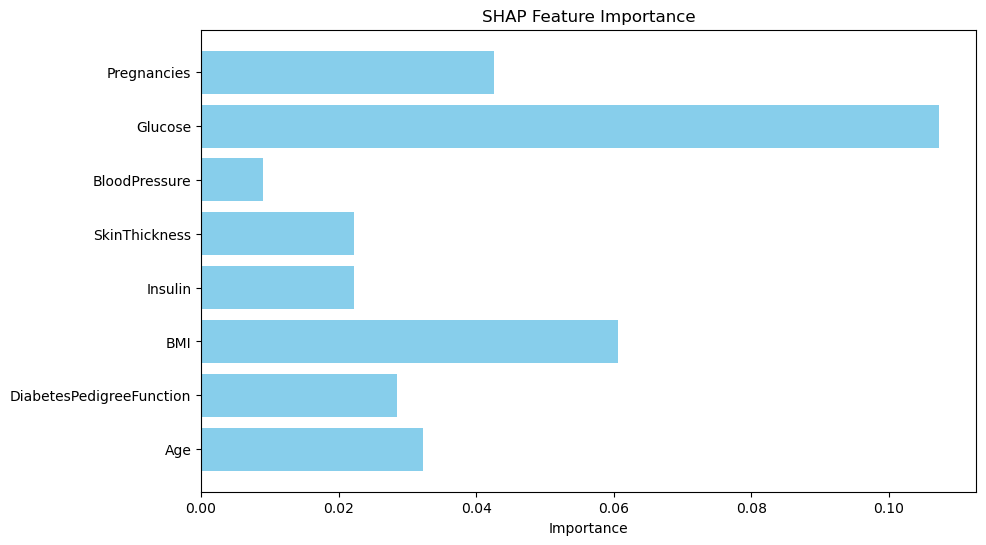

In [130]:
# Calculate average SHAP feature importance
shap_importance = np.mean(np.abs(shap_values[0]), axis=0)
shap_importance_dict = {feature: importance for feature, importance in zip(df.drop(columns='Outcome').columns, shap_importance)}

print("SHAP Feature Importance:")
for feature, importance in shap_importance_dict.items():
    print(f"{feature}: {importance:.4f}")

plot_feature_importance(shap_importance_dict, 'SHAP Feature Importance')

# Part3

## NAM

In [1]:
# pip list

In [2]:
!git clone https://github.com/lemeln/nam.git

Cloning into 'nam'...
remote: Enumerating objects: 1115, done.
remote: Counting objects: 100% (127/127), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 1115 (delta 95), reused 89 (delta 81), pack-reused 988
Receiving objects: 100% (1115/1115), 6.60 MiB | 30.03 MiB/s, done.
Resolving deltas: 100% (691/691), done.


In [3]:
cd nam

/kaggle/working/nam


In [4]:
!pip install -e .

Obtaining file:///kaggle/working/nam
  Preparing metadata (setup.py) ... done
  Running setup.py develop for nam-interpret


In [5]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = '../../input/diabetes-tai-hw2/diabetes.csv'
df = pd.read_csv(file_path)

columns_shouldnt_have_zero = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']
for column in columns_shouldnt_have_zero:
    median_value = df[df[column] != 0][column].median()
    df[column] = df[column].replace(0, median_value)

# Split the dataset into features and target
X = df.drop(columns='Outcome')
y = df['Outcome']

random_state = 40
# Split the data into training (70%), validation (10%), and testing (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=random_state)

# Further split the temporary set into validation (10% of original) and testing (20% of original) sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=random_state)

# Normalize the data
scaler = StandardScaler()
X_train_normal = scaler.fit_transform(X_train.to_numpy())
X_val_normal = scaler.transform(X_val.to_numpy())
X_test_normal = scaler.transform(X_test.to_numpy())

# Checking the shapes of the train, validation, and test sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

uni, counts = np.unique(y_train, return_counts=True)
weights_dict = {i : j / counts.sum() for i, j in zip(uni, counts)}

Training set shape: (537, 8) (537,)
Validation set shape: (77, 8) (77,)
Testing set shape: (154, 8) (154,)


In [6]:
import torch
from nam.wrapper import NAMClassifier
import sklearn.metrics as sk_metrics
device = 'cuda'

model = NAMClassifier(
            num_epochs=1000,
            num_learners=40,
            metric='auroc',
            early_stop_mode='max',
            monitor_loss=True,
            n_jobs=4,
            random_state=random_state,
            device=device
        )

model.fit(X_train_normal, y_train.to_numpy())
pred = model.predict_proba(X_test_normal)
sk_metrics.roc_auc_score(y_test.to_numpy(), pred)

/kaggle/working/nam/nam/trainer/trainer.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2024-05-22 01:41:53.337005: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-22 01:41:53.337115: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-22 01:41:53.474525: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-22 01:42:09.008772: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attemptin

0.7859396914446003

In [16]:
def get_plot_data(self, feature_index, num_samples = 500) -> None:

    X = np.zeros((num_samples, self.num_inputs))
    X[:, feature_index] = np.linspace(-1.0, 1.0, num_samples)

    X[:, feature_index] = np.linspace(-1.0, 1.0, num_samples)

    feature_outputs = []
    for model in self.models:
        # (examples, tasks, features)
        _, fnns_out = model.forward(torch.tensor(X, dtype=torch.float32))
        # (examples, tasks)

        feature_outputs.append(fnns_out[:, :, feature_index].detach().cpu().numpy())

    # (learners, examples, tasks)
    feature_outputs = np.stack(feature_outputs, axis=0)
    # (examples, tasks)
    y = np.mean(feature_outputs, axis=0).squeeze()
    conf_int = np.std(feature_outputs, axis=0).squeeze()
    # TODO: Scale conf_int according to units of y

    # X = self._preprocessor.inverse_transform(X)

    return {'x': X[:, feature_index], 'y': y, 'conf_int': conf_int}

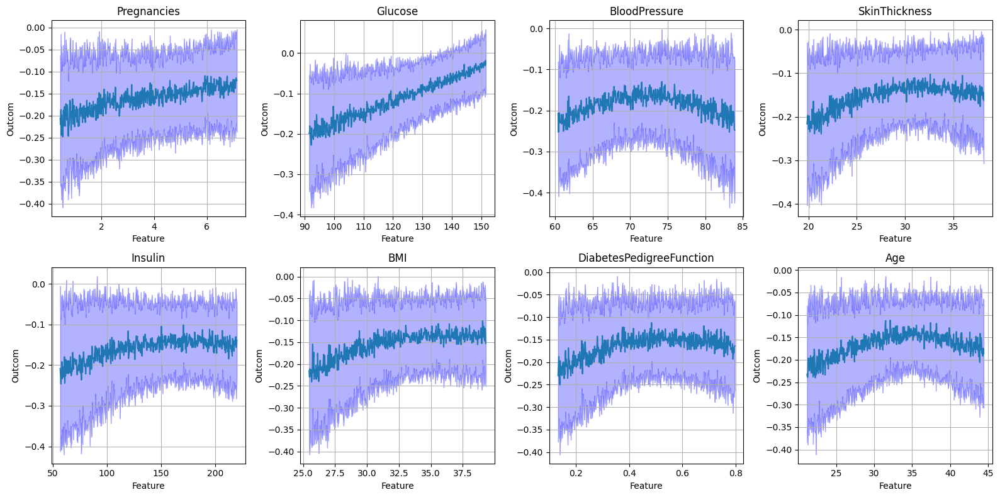

In [17]:
import matplotlib.pyplot as plt

def plot_data(model, num_features, feature_labels=None, num_rows = 2, num_cols = 4):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 8))
    for i, ax in enumerate(axes.flatten()):
        if i < num_features:
            data = get_plot_data(model, i)
            x = data['x']
            y = data['y']
            conf_int = data['conf_int']
            x = scaler.inverse_transform(np.expand_dims(x, axis=1).repeat(8,1))[:, i]
            ax.plot(x, y)
            ax.fill_between(x, y - conf_int, y + conf_int, color='blue', alpha=0.3)
            ax.set_xlabel('Feature')
            ax.set_ylabel('Outcom')
            ax.set_title(feature_labels[i])
            ax.grid(True)
    plt.tight_layout()
    plt.show()

num_features = 8
plot_data(model, num_features, feature_labels=X_test.columns)

# Grace

In [133]:
!git clone https://github.com/lethaiq/GRACE_KDD20.git

Cloning into 'GRACE_KDD20'...
remote: Enumerating objects: 58, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 58 (delta 18), reused 33 (delta 5), pack-reused 0
Unpacking objects: 100% (58/58), 3.51 MiB | 608.00 KiB/s, done.


In [ ]:
# change methods.py file in grace repo and add function named 'zero_gradients' instead of 'torch.autograd.gradcheck import zero_gradients'

# the zero_gradients is like this:

# def zero_gradients(x):
#     if isinstance(x, torch.Tensor):
#         if x.grad is not None:
#             x.grad.detach_()
#             x.grad.zero_()
#     elif isinstance(x, collections.abc.Iterable):
#         for elem in x:
#             zero_gradients(elem)

# also change explain.py. there is synatax at the end of file like this:
# tmp = "{} {} {} {}, ".format(features[feat], direction, distance, units[feat])
# it should change to:
# tmp = "{} {} {}, ".format(features[feat], direction, distance)

In [138]:
!pip install texttable

In [143]:
cd GRACE_KDD20/

/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20


In [152]:
!python main.py --csv diabetes.csv --hiddens 10 10 --lr 0.001 --gen_gamma 0.5 --gen_max_features 5


/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.fillna(method="backfill")
Training...
Val loss: 0.7487 Val acc: 0.4714
Val loss: 0.6445 Val acc: 0.6429
Val loss: 0.6048 Val acc: 0.6429
Val loss: 0.5824 Val acc: 0.7000
Val loss: 0.5744 Val acc: 0.7000

  Dataset     Accuracy    F1  
Validation    0.700     0.690
Test          0.714     0.714
/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.fillna(method="backfill")
Generating Contrastive Sample...100%

 Dataset   #avgFeatChanged   Fidelity
Test           1.870         0.883  
/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is d

In [34]:
!python main.py --csv diabetes.csv --hiddens 10 10 --lr 0.001 --gen_gamma 0.5 --gen_max_features 8


/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.fillna(method="backfill")
Training...
Val loss: 0.7487 Val acc: 0.4714
Val loss: 0.6445 Val acc: 0.6429
Val loss: 0.6048 Val acc: 0.6429
Val loss: 0.5824 Val acc: 0.7000
Val loss: 0.5744 Val acc: 0.7000

  Dataset     Accuracy    F1  
Validation    0.700     0.690
Test          0.714     0.714
/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.fillna(method="backfill")
Generating Contrastive Sample...100%

 Dataset   #avgFeatChanged   Fidelity
Test           2.221         0.883  
/mnt/d/uni/4th_semster/Trustworthy AI/HW2/GRACE_KDD20/src/utils.py:108: FutureWarning: DataFrame.fillna with 'method' is d